In [1]:
!pip install tqdm

In [2]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from tqdm import tqdm
import matplotlib.pylab as plt
from math import *
import matplotlib.cm as cm
from scipy.ndimage import gaussian_filter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib as mpl

In [25]:
#load h5 file as a dataframe, df (r'path_of_file')
df = pd.read_hdf(r'C:\Users\Mark\Master_Algorithm-Patrick_Zong-2023-06-26\videos\2114\20210815-map2114-T_1DLC_resnet50_Master_AlgorithmJun26shuffle1_3540000_filtered.h5')
df.iloc[:5]

scorer    DLC_resnet50_Master_AlgorithmJun26shuffle1_3540000              \
bodyparts                                            noseTip               
coords                                                     x           y   
0                                                1385.014038  578.353699   
1                                                1385.014038  578.353699   
2                                                1385.014038  578.353699   
3                                                1385.014038  578.353699   
4                                                1385.014038  578.353699   

scorer                                                                 \
bodyparts                 leftEar                            rightEar   
coords    likelihood            x           y likelihood            x   
0           0.999979  1360.528320  494.738251   0.999964  1336.470825   
1           0.999979  1360.529053  494.740112   0.999964  1336.470825   
2           0.999979  1360.529053  494.740112   0.999964  1336.470825   
3           0.999979  1360.529053  494.740112   0.999963  1336.470825   
4           0.999979  1360.529053  494.739746   0.999963  1336.471191   

scorer                                                               
bodyparts                           tailBase                         
coords              y likelihood           x           y likelihood  
0          556.726013   0.999938  930.539551  635.986877   0.998894  
1          556.726013   0.999937  930.540100  635.986877   0.998895  
2          556.726013   0.999937  930.540100  635.986877   0.998895  
3          556.726013   0.999938  930.540100  635.986877   0.998895  
4          556.726013   0.999938  930.540100  635.986877   0.998895

In [26]:
def coord_extractor(df):
    
    #this function aims to extract data included in the loaded h5 file, x and y coordinates separately
    #THIS TAKES A WHILE, PROPORTIONAL TO DATAFILE SIZE
    
    #This code is agnostic of label name.. rather it assumes that the label position (i.e. column) is the same across all files..
    #dictionary accofrding to df read above:  
    #        position:      0        1         2         3
    #        label:       snout    LE        RE        TB
    
    global xcoord, ycoord

    xcoord = np.ones((len(df),4)) #making an 2D array with all the x coordinates (len(df) is number of rows AND 4 is the number of labels)
    ycoord = np.ones((len(df),4)) #making an 2D array with all the y coordinates (len(df) is number of rows AND 4 is the number of labels)

    for i in tqdm(range(0, len(df)), desc='Extracting Coordinates'): #for i in range(0, f + 2): 
        xcoord[i]= [float(df.get(df.keys()[0])[i]), float(df.get(df.keys()[3])[i]), float(df.get(df.keys()[6])[i]), float(df.get(df.keys()[9])[i])]
        ycoord[i]= [float(df.get(df.keys()[1])[i]), float(df.get(df.keys()[4])[i]), float(df.get(df.keys()[7])[i]), float(df.get(df.keys()[10])[i])]


  
    return

In [27]:
coord_extractor(df)

Extracting Coordinates: 100%|████████████████████████████████████████████████| 108299/108299 [00:41<00:00, 2636.40it/s]


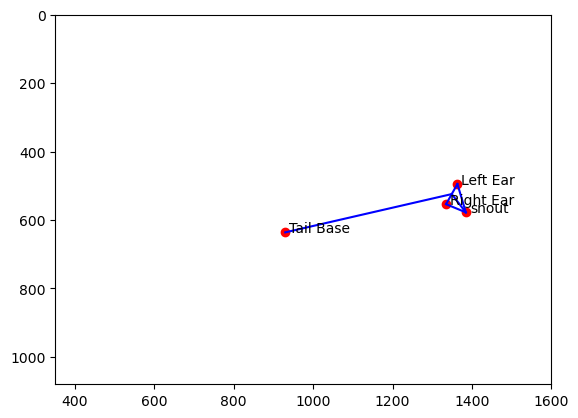

In [28]:
# example of how to view a single frame, f, as a scatter

#make sure to plot random frames (by changing f) to make sure the labels make sense 


f = 100
plt.scatter(xcoord[f], ycoord[f], c='r')
plt.annotate('snout', xy=(xcoord[f][0]+10, ycoord[f][0]))
plt.annotate('Left Ear', xy=(xcoord[f][1]+10, ycoord[f][1]))
plt.annotate('Right Ear', xy=(xcoord[f][2]+10, ycoord[f][2]))
plt.annotate('Tail Base', xy=(xcoord[f][3]+10, ycoord[f][3]))


#draw rudimentary skeleton for check
plt.plot([xcoord[f][1], xcoord[f][2]], [ycoord[f][1], ycoord[f][2]], c='b')
plt.plot([xcoord[f][0], xcoord[f][2]], [ycoord[f][0], ycoord[f][2]], c='b')
plt.plot([xcoord[f][1], xcoord[f][0]], [ycoord[f][1], ycoord[f][0]], c='b')

mx = (xcoord[f][1]+ xcoord[f][2])/2.0    # find ear x midpoint
my = (ycoord[f][1] + ycoord[f][2])/2.0   # find ear y midpoint

plt.plot([mx, xcoord[f][0]], [my, ycoord[f][0]], c='b')
plt.plot([mx, xcoord[f][3]], [my, ycoord[f][3]], c='b')

plt.xlim(350, 1600)     #(350, 1600) xdim of box
plt.ylim(0, 1080)     #(0, 1080) ydim of box
plt.gca().invert_yaxis()

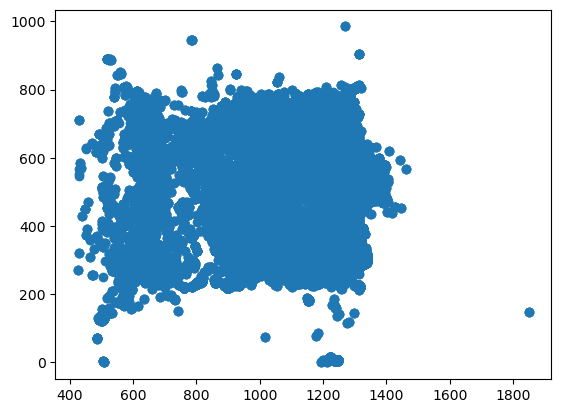

In [29]:
#plot raw data, basically the pose estimates spat out by DLC

# a little hard to interpret as it is plotting every label simultanouesly
plt.scatter(xcoord, ycoord)

#looking at this, I believe any point where X<400 and y>~900 seems artifactual (i.e. DLC is dropping labels outside the real field of view)
# there is a way to intially tell DLC to not label anything if the confidence of the label is too low at a user-defined threshold

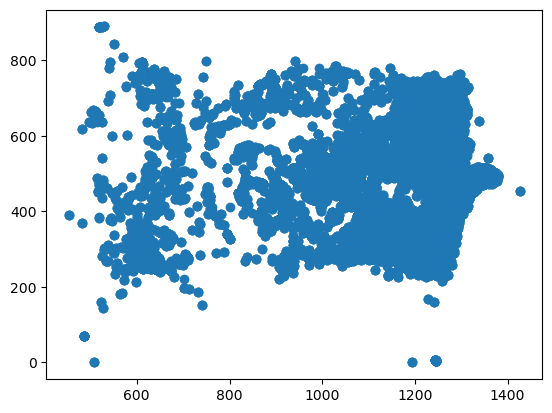

In [30]:
#the number after the comma represents the bodypart
plt.scatter(xcoord[:,1], ycoord[:,1]) #0-snout, 1-leftEar, 2-rightEar, 3-tailBase

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0, 0.5, 'snout Y-coord')

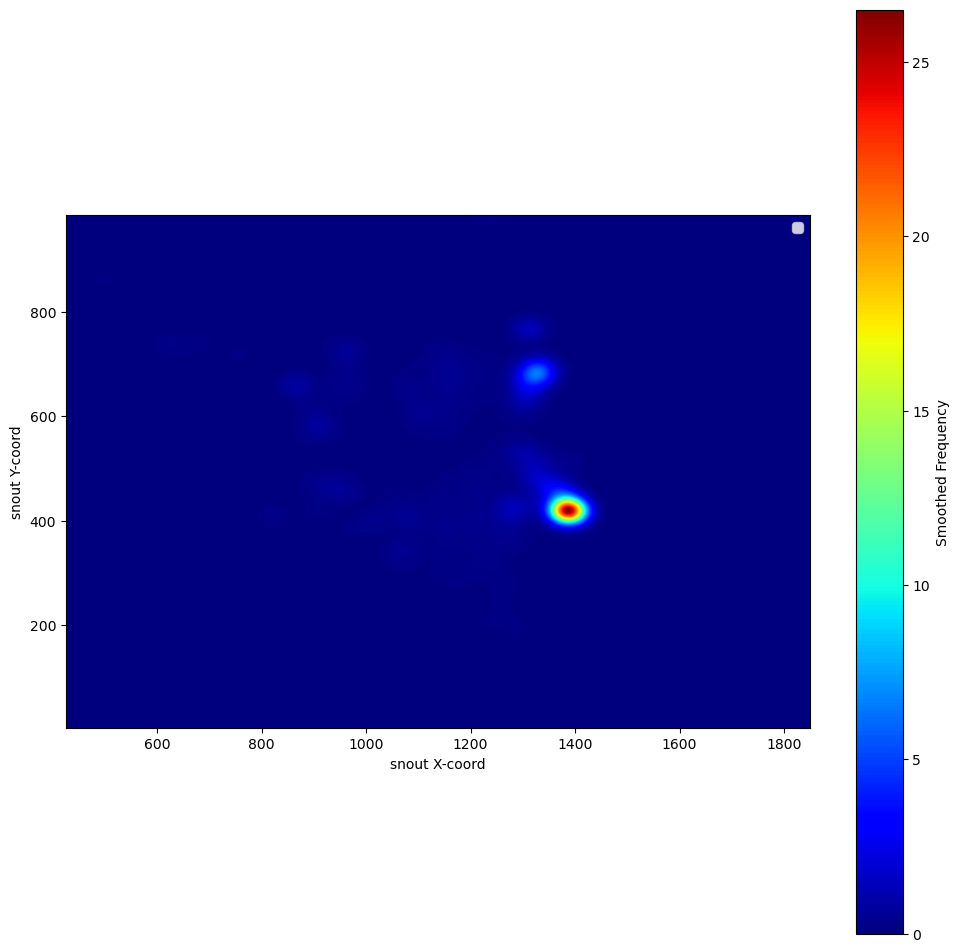

In [31]:

def heat_plotter(x,y, sigma, bins=1000):
    heat, xedge, yedge = np.histogram2d(x,y,bins=bins)
    heat = gaussian_filter(heat, sigma=sigma)
    extent = [xedge[0], xedge[-1], yedge[0], yedge[-1]]
    return heat.T, extent
    
x = xcoord[:,0] #the number after the comma represents the bodypart
y = ycoord[:,0] #0-snout, 1-leftEar, 2-rightEar, 3-tailBase

x_clean = []
y_clean = []
for i in range(0, len(x)):
    if x[i]<200:       #arbitrary filter based on observations..
        continue
    else:
        x_clean.append(x[i])
        y_clean.append(y[i])

image, extent = heat_plotter(x_clean, y_clean, sigma=16)
fig = plt.subplots(figsize=(12,12))
plt.imshow(image, extent=extent, cmap=cm.jet)
#plt.gca().invert_yaxis()
plt.colorbar(label='Smoothed Frequency')
plt.legend()
plt.xlabel('snout X-coord')
plt.ylabel('snout Y-coord')


In [32]:
heat.T.shape

NameError: name 'heat' is not defined

In [33]:
def calc_metrics(xcoord, ycoord, clean=True):
    #example of how to employ a function to iterate through data and calculate something based on coordinates
    
    # clean=True is a provision that I added in case labels are very extreme (e.g. DLC stil labels things off frame when it does not know whewre they go, the label gets placed in a corner, i.e. very low values)
    
    #        position:      0        1         2         3
    #        label:       snout    LE        RE        TB
    
    
    #set up global variables that you want to access outside of the function
    global t2s, m2s, theta, dtheta
    
    
    t2s = []    #tail-to-snout distance
    for i in range(0, len(xcoord)):
        if clean ==True and xcoord[i][0]<5:
            t2s.append(np.nan)
        else:
            t2s.append(sqrt((xcoord[i][0] - xcoord[i][3])**2 + (ycoord[i][0] - ycoord[i][3])**2))
        
        
        
        
    m2s = []    # ear midpoint distance to snout
    for i in range(0, len(xcoord)):
        if clean ==True and xcoord[i][0]<5:
            m2s.append(np.nan)
        else:
            mx = (xcoord[i][1]+ xcoord[i][2])/2.0    # find ear x midpoint
            my = (ycoord[i][1] + ycoord[i][2])/2.0   # find ear y midpoint
            m2s.append(sqrt( (xcoord[i][0]-mx )**2 + (ycoord[i][0]-my)**2))
        
        
    
    theta = [] # from ear midpoint to snout
    dtheta = []  #change in delta from frame to frame
    for i in range(0, len(xcoord)):
        if clean ==True and xcoord[i][0]<5:
            theta.append(np.nan)
            dtheta.append(np.nan)
        else:
            mx = (xcoord[i][1]+ xcoord[i][2])/2.0    # find ear x midpoint
            my = (ycoord[i][1] + ycoord[i][2])/2.0   # find ear y midpoint      
            theta.append((np.arctan2([ycoord[i][0]-my], [xcoord[i][0]-mx])*180/np.pi)[0])
            dtheta.append(theta[i]-theta[i-1])

        
    
    return
    
    

In [34]:
calc_metrics(xcoord, ycoord, clean=False)

Text(0, 0.5, 'distance between snout and tail base(pixels)')

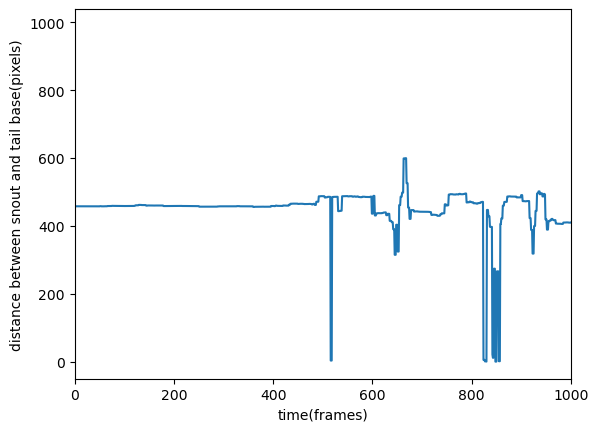

In [35]:
#sample plot at xlim, for a given measure

#if one has the stim onset/offset times, one could draw vertical lines into this plot

measure = t2s    #could be theta, dtheta, t2s, m2s, etc...

plt.plot(measure)
plt.xlim(0, 1000)
plt.xlabel('time(frames)')
plt.ylabel('distance between snout and tail base(pixels)') 

In [36]:
def theta2rad(theta):
    global rad
    
    rad=[]
    for i in range(0, len(theta)):
        rad.append(np.deg2rad(theta[i]))
        
    return

In [37]:
#SOMEONE ELSE BUILT THIS FUNCTION!!!!    https://stackoverflow.com/questions/22562364/circular-polar-histogram-in-python

def circular_hist(ax, x, bins=16, density=True, offset=0, gaps=True):
    global patches, radius, colors
    """
    Produce a circular histogram of angles on ax.

    Parameters
    ----------
    ax : matplotlib.axes._subplots.PolarAxesSubplot
        axis instance created with subplot_kw=dict(projection='polar').

    x : array
        Angles to plot, expected in units of radians.

    bins : int, optional
        Defines the number of equal-width bins in the range. The default is 16.

    density : bool, optional
        If True plot frequency proportional to area. If False plot frequency
        proportional to radius. The default is True.

    offset : float, optional
        Sets the offset for the location of the 0 direction in units of
        radians. The default is 0.

    gaps : bool, optional
        Whether to allow gaps between bins. When gaps = False the bins are
        forced to partition the entire [-pi, pi] range. The default is True.

    Returns
    -------
    n : array or list of arrays
        The number of values in each bin.

    bins : array
        The edges of the bins.

    patches : `.BarContainer` or list of a single `.Polygon`
        Container of individual artists used to create the histogram
        or list of such containers if there are multiple input datasets.
    """
    # Wrap angles to [-pi, pi)
    x = (x+np.pi) % (2*np.pi) - np.pi

    # Force bins to partition entire circle
    if not gaps:
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    n, bins = np.histogram(x, bins=bins)

    # Compute width of each bin
    widths = np.diff(bins)

    # By default plot frequency proportional to area
    if density:
        # Area to assign each bin
        area = n / x.size
        # Calculate corresponding bin radius
        radius = (area/np.pi) ** .5
    # Otherwise plot frequency proportional to radius
    else:
        radius = n
    
    colors = cm.viridis(radius / float(max(radius)))
    
    # Plot data on ax
    patches = ax.bar(bins[:-1], radius, zorder=1, align='edge', width=widths,
                     edgecolor='k', fill=True, linewidth=3, color=colors)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels for area plots (they are mostly obstructive)
    if density:
        ax.set_yticks([])


    return n, bins, patches

In [38]:
#min(radius)

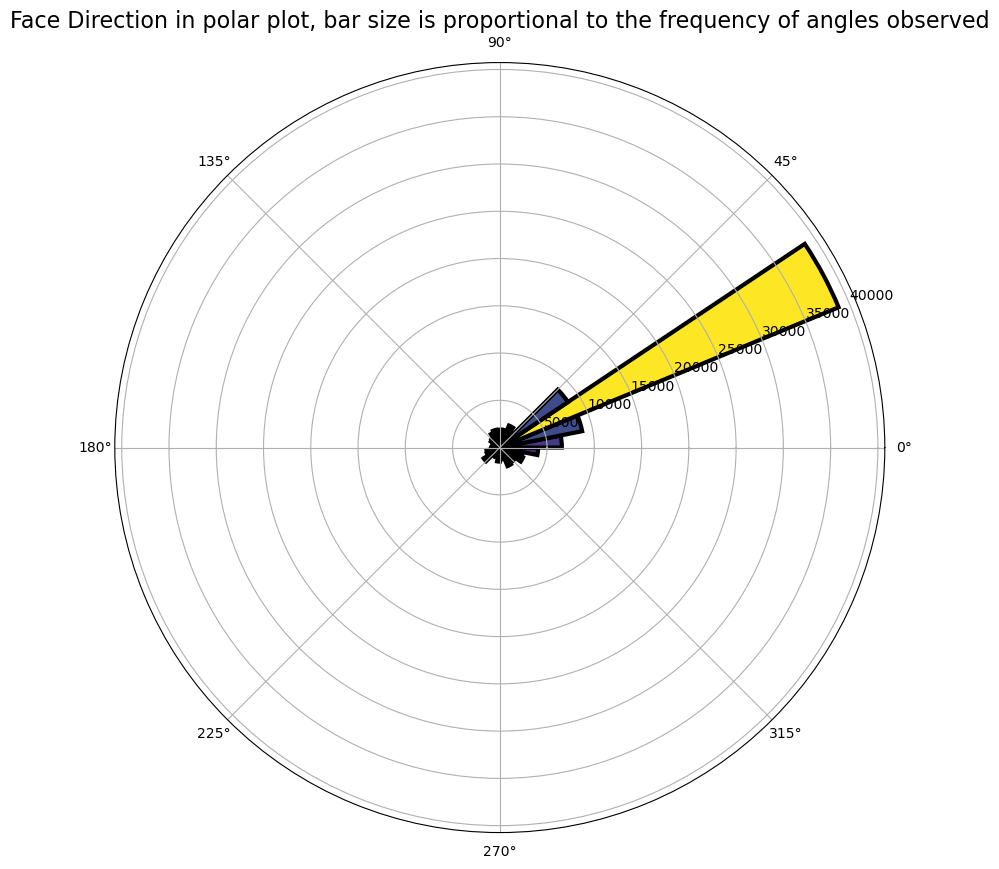

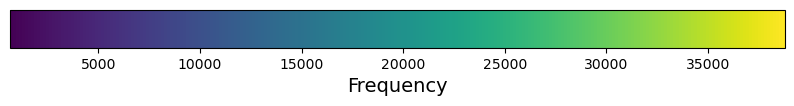

In [39]:

fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(projection='polar'))
theta2rad(theta)

circular_hist(ax, np.array(rad), density=False, bins=32)  #bin value is modifiable for more refined bars (it's basically a histogram)
ax.set_title('Face Direction in polar plot, bar size is proportional to the frequency of angles observed', fontsize=16)




plt.show()

#couldnt really get the heatbar to be besides the polar plot without severe complications



cmap = mpl.cm.viridis
norm = mpl.colors.Normalize(vmin=min(radius), vmax=max(radius))
fig, ax = plt.subplots(figsize=(10, 1))
fig.subplots_adjust(bottom=0.5)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,norm=norm,orientation='horizontal')
cb1.set_label('Frequency', fontsize=14)

In [18]:
xcoord

array([[1385.01403809, 1360.52832031, 1336.4708252 ,  930.53955078],
       [1385.01403809, 1360.52905273, 1336.4708252 ,  930.5401001 ],
       [1385.01403809, 1360.52905273, 1336.4708252 ,  930.5401001 ],
       ...,
       [1392.82226562, 1358.2845459 , 1331.44042969, 1010.69152832],
       [1392.78747559, 1358.26660156, 1331.39794922, 1010.69152832],
       [1392.77026367, 1358.26074219, 1331.39587402, 1010.69152832]])

# Example of how PCAing could look with xccord and ycoord

In [82]:
for i in range(0, len(xcoord)):
    if xcoord[i][0] < 5:
        print('below')

In [83]:

#cleans up arrays if the head label is off frame

new_x = []
new_y = []

for i in range(0, len(xcoord)):
    if xcoord[i][0] < 5:
        continue
    else:
        new_x.append(xcoord[i])
        new_y.append(ycoord[i])
    
    
    
    
    

In [84]:
new_x[0][3]

930.53955078125

In [85]:
#pca the xcoords

pca = PCA(n_components=3)
pca.fit(xcoord)  #probably redundant given next function
x_transf = pca.fit_transform(new_x)

pcx1 = x_transf[:,0]
pcx2 = x_transf[:,1]
pcx3 = x_transf[:,2]

In [86]:
#pca the ycoords

pca = PCA(n_components=3)
pca.fit(xcoord)  #probably redundant given next function
y_transf = pca.fit_transform(new_y)

pcy1 = y_transf[:,0]
pcy2 = y_transf[:,1]
pcy3 = y_transf[:,2]

Text(0, 0.5, 'PC1-Y')

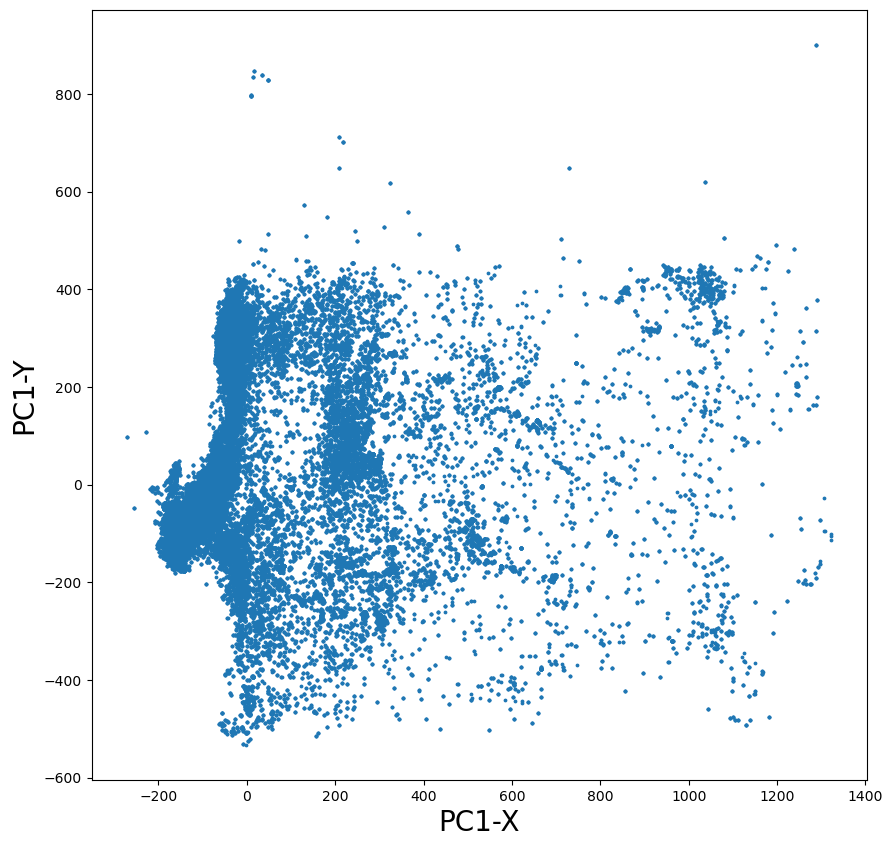

In [87]:
# THIS IS WHERE IT IS VERY USEFUL TO KNOW AT WHICH FRAMES THE SOUND IS PLAYED

fig = plt.subplots(figsize=(10,10))
plt.scatter(pcx1, pcy1, s=3)
plt.xlabel('PC1-X', fontsize=20)
plt.ylabel('PC1-Y', fontsize=20)

In [88]:
x

array([1360.52832031, 1360.52905273, 1360.52905273, ..., 1358.2845459 ,
       1358.26660156, 1358.26074219])

In [89]:
xcoord[:,0]

array([1385.01403809, 1385.01403809, 1385.01403809, ..., 1392.82226562,
       1392.78747559, 1392.77026367])

In [90]:
data

NameError: name 'data' is not defined

In [91]:
xy = np.zeros((len(x),2))
xy[:,0] = x
xy[:,1] = y
pca = PCA(n_components=2)
data = pca.fit_transform(xy)

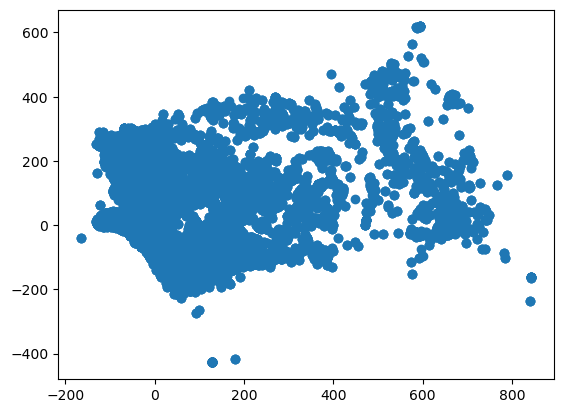

In [92]:
xs = list(range(0, len(data)))
plt.scatter(data[:,0],data[:,1])

(array([   229.,   1364.,   2204.,   2795.,   5260.,   7299.,  13061.,
         28688.,  62156., 108299.]),
 array([ 453.5451355 ,  550.80749207,  648.06984863,  745.3322052 ,
         842.59456177,  939.85691833, 1037.1192749 , 1134.38163147,
        1231.64398804, 1328.9063446 , 1426.16870117]),
 [<matplotlib.patches.Polygon at 0x20c602aa3b0>])

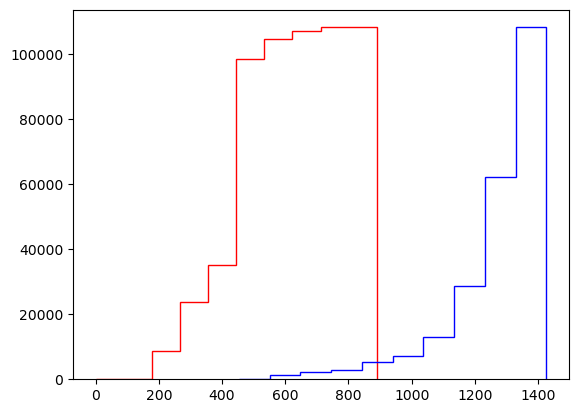

In [93]:
plt.hist(y, cumulative=True, fill=False, histtype='step', color='r')
plt.hist(x, cumulative=True, fill=False, histtype='step', color='b')
#plt.hist(data[:,0], cumulative=True, fill=False, histtype='step', color='g')
#plt.hist(data[:,1], cumulative=True, fill=False, histtype='step', color='k')

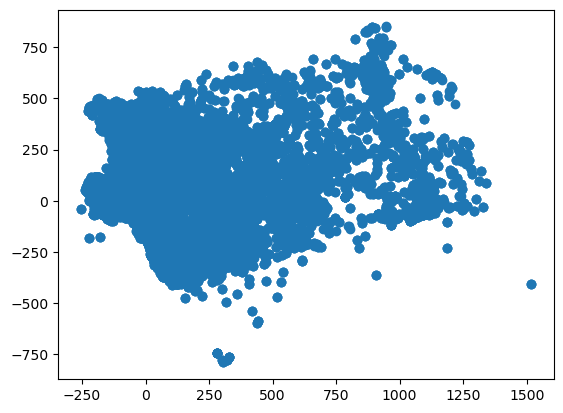

In [94]:
pca = PCA(n_components = 2)
data = np.ones((len(x), 2))
data[:,0]=pcx1
data[:,1]=pcy1
egh = pca.fit_transform(data)
plt.scatter(egh[:,0],egh[:,1])

In [95]:
vector=[]
for i in range(0, len(x)):
    vector.append(abs(sqrt(x[i]**2+y[i]**2)))
    
clean_vec = []
clean_theta=[]
for i in range(0, len(vector)):
    if vector[i]<500:
        continue
    else:
        clean_vec.append(vector[i])
        clean_theta.append(theta[i])

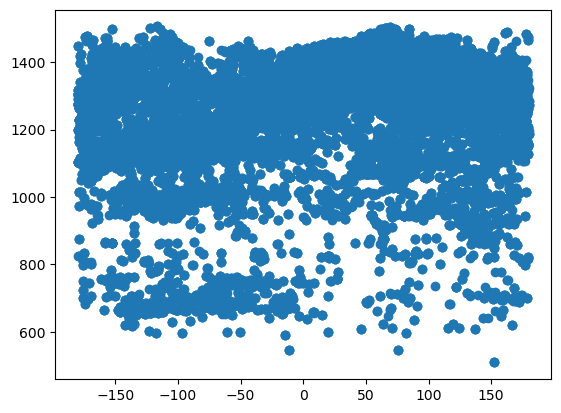

In [96]:
plt.scatter(clean_theta, clean_vec)
mean = []
for i in range(0, len(clean_theta)):
    mean.append((clean_theta[i]+clean_vec[i])/2.0)
xs = list(range(0, len(clean_theta)))
#plt.plot(xs, mean, c='r')


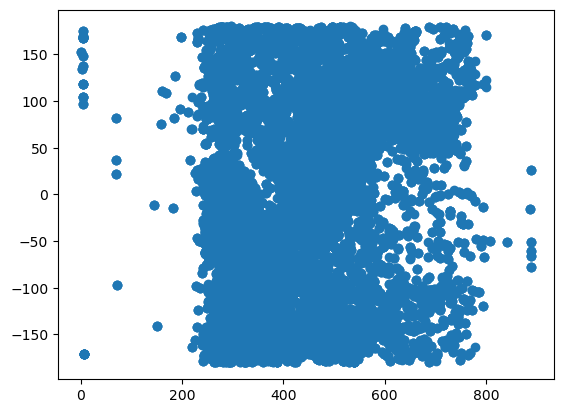

In [97]:
plt.scatter(y, theta)

In [98]:
g_df = pd.DataFrame({'x':x, 'theta':theta, 'y':y, 'vector':vector})

In [99]:
g_df

,x,theta,y,vector
0,1360.528320,55.242955,494.738251,1447.688933
1,1360.529053,55.242749,494.740112,1447.690258
2,1360.529053,55.242749,494.740112,1447.690258
3,1360.529053,55.242749,494.740112,1447.690258
4,1360.529053,55.242977,494.739746,1447.690132
...,...,...,...,...
108294,1362.809448,46.386433,492.034668,1448.912595
108295,1362.809448,46.381745,492.049438,1448.917611
108296,1358.284546,37.145838,502.009796,1448.085199
108297,1358.266602,37.148285,502.009796,1448.068367


In [100]:
import plotly.express as px

In [101]:
fig = px.scatter_3d(g_df, x='x', y='y', z='theta')
fig.show()